In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import mofax as mfx
#import os 
#os.chdir("../")

In [2]:
from matplotlib import rcParams
rcParams["figure.dpi"] = 200

In [3]:
scenario_files = {
    'scenario_no_filtering': mfx.mofa_model("s_factor_10_no_filter_wt&ko_mofa_model.hdf5"),
    'scenario_5_filtering': mfx.mofa_model("s_factor_10_filter_5%_wt&ko_mofa_model.hdf5"),
    'scenario_10%_filtering': mfx.mofa_model("s_factor_10_filter_10%_wt&ko_mofa_model.hdf5"),
    'scenario_15%_filtering': mfx.mofa_model("s_factor_10_filter_15%_wt&ko_mofa_model.hdf5"),
    'scenario_20%_filtering': mfx.mofa_model("s_factor_10_filter_20%_wt&ko_mofa_model.hdf5"),
}

In [4]:
#mean values of each sum_abs for each scenario top 100 features
mean_values = {}
for scenario, model in scenario_files.items():
    df = model.get_weights(df=True)
    df['sum_abs'] = df.apply(lambda row: np.sum(np.abs(row)), axis=1)
    df = df.sort_values(by='sum_abs', ascending=False)
    mean_values[scenario] = df['sum_abs'][:100].mean()
mean_values

{'scenario_no_filtering': 3.3713146755159693,
 'scenario_5_filtering': 3.2928099354420537,
 'scenario_10%_filtering': 2.9793696072198377,
 'scenario_15%_filtering': 3.0799083054151093,
 'scenario_20%_filtering': 2.6029786993060786}

In [5]:
#use for loop to get absolute values of weights for each scenario   

for scenario, m in scenario_files.items():
    sum_abs= []
    weights_df = m.get_weights(df=True)
    for i in range(len(weights_df)):
        sum_abs.append(np.sum(np.abs(weights_df.iloc[i])))
    df = pd.DataFrame(weights_df)
    df['sum_abs'] = sum_abs
    df = df.sort_values(by='sum_abs', ascending= False)
    scenario_files[scenario] = df.iloc[:100]

In [6]:
#plot the top 100 features for each scenario
plt.figure(figsize=(30, 30), dpi=500, clear=True, frameon= True)
for i, (scenario, df) in enumerate(scenario_files.items()):
    plt.subplot(3, 2, i+1)
    sns.barplot(x=df['sum_abs'], y=df.index)
    plt.title(f'{scenario}: Top 100 features')
    plt.xlabel('Sum of absolute values')
    plt.ylabel('Feature')
plt.tight_layout()

In [7]:
#in scenario L, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
scenario_no_filtering_binary = scenario_files['scenario_no_filtering']
scenario_no_filtering_binary['binary'] = scenario_no_filtering_binary['sum_abs'].apply(lambda x: 1 if x > mean_values['scenario_no_filtering'] else 0)
scenario_no_filtering_binary.head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,sum_abs,binary
Wfdc17,-0.051657,0.126913,-0.014844,-0.349336,0.016490,-0.036681,-0.707034,0.854398,-3.351002,5.508355,1
Rps12l1,0.061360,-0.470189,0.009413,-0.100271,3.887511,-0.004877,0.006320,0.399108,0.189596,5.128645,1
Tyrobp,0.089607,0.251305,0.006644,-0.804128,-0.166682,0.000278,-0.052881,1.522884,-1.823974,4.718383,1
Tm4sf4,0.585091,0.324693,-0.002012,-1.214551,-0.170441,-0.000004,0.001715,-2.398555,0.000488,4.697549,1
TAG(54:2)_TAG,-2.874649,-0.138472,0.707603,-0.069987,-0.013824,-0.044498,-0.607157,0.031167,0.061377,4.548735,1


In [8]:
#min_max normalization on sum_abs weights for scenario_no_filtering
scenario_no_filtering_min_max = scenario_files['scenario_no_filtering']
scenario_no_filtering_min_max['min_max'] = (scenario_no_filtering_min_max['sum_abs'] - scenario_no_filtering_min_max['sum_abs'].min()) / (scenario_no_filtering_min_max['sum_abs'].max() - scenario_no_filtering_min_max['sum_abs'].min())
scenario_no_filtering_min_max.head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,sum_abs,binary,min_max
Wfdc17,-0.051657,0.126913,-0.014844,-0.349336,0.016490,-0.036681,-0.707034,0.854398,-3.351002,5.508355,1,1.000000
Rps12l1,0.061360,-0.470189,0.009413,-0.100271,3.887511,-0.004877,0.006320,0.399108,0.189596,5.128645,1,0.857991
Tyrobp,0.089607,0.251305,0.006644,-0.804128,-0.166682,0.000278,-0.052881,1.522884,-1.823974,4.718383,1,0.704557
Tm4sf4,0.585091,0.324693,-0.002012,-1.214551,-0.170441,-0.000004,0.001715,-2.398555,0.000488,4.697549,1,0.696765
TAG(54:2)_TAG,-2.874649,-0.138472,0.707603,-0.069987,-0.013824,-0.044498,-0.607157,0.031167,0.061377,4.548735,1,0.641109


In [9]:
#in scenario M, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
scenario_10_filtering_binary  = scenario_files['scenario_10%_filtering']
scenario_10_filtering_binary['binary'] = scenario_10_filtering_binary['sum_abs'].apply(lambda x: 1 if x > mean_values['scenario_10%_filtering'] else 0)
scenario_10_filtering_binary.head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,sum_abs,binary
Wfdc17,0.049006,-0.012884,0.082081,-0.304973,3.097623,-0.635052,-0.021250,0.018799,-0.330368,4.552036,1
Fcna,-0.022628,-0.042527,-0.002154,0.115650,3.127100,-0.548780,-0.000174,-0.567282,-0.048900,4.475194,1
Tyrobp,0.009515,-0.058300,0.227262,-0.821621,1.753205,-0.111318,0.000532,1.195574,-0.086358,4.263685,1
Lrg1,-0.026155,-0.012972,-0.233955,0.200911,1.979138,-0.301498,1.148369,-0.172905,0.049114,4.125016,1
Cd300ld__ENSMUSG00000034641.2,0.595784,0.015715,-0.102845,-0.191824,2.395724,-0.006810,0.285393,0.318211,-0.000099,3.912406,1


In [10]:
#min_max normalization on sum_abs weights for scenario M
scenario_10_filtering_min_max = scenario_files['scenario_10%_filtering']
scenario_10_filtering_min_max['min_max'] = (scenario_10_filtering_min_max['sum_abs'] - scenario_10_filtering_min_max['sum_abs'].min()) / (scenario_10_filtering_min_max['sum_abs'].max() - scenario_10_filtering_min_max['sum_abs'].min())
scenario_10_filtering_min_max

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,sum_abs,binary,min_max
Wfdc17,0.049006,-0.012884,0.082081,-0.304973,3.097623,-0.635052,-0.021250,0.018799,-0.330368,4.552036,1,1.000000
Fcna,-0.022628,-0.042527,-0.002154,0.115650,3.127100,-0.548780,-0.000174,-0.567282,-0.048900,4.475194,1,0.962939
Tyrobp,0.009515,-0.058300,0.227262,-0.821621,1.753205,-0.111318,0.000532,1.195574,-0.086358,4.263685,1,0.860927
Lrg1,-0.026155,-0.012972,-0.233955,0.200911,1.979138,-0.301498,1.148369,-0.172905,0.049114,4.125016,1,0.794046
Cd300ld__ENSMUSG00000034641.2,0.595784,0.015715,-0.102845,-0.191824,2.395724,-0.006810,0.285393,0.318211,-0.000099,3.912406,1,0.691504
...,...,...,...,...,...,...,...,...,...,...,...,...
Prdx2,-0.055965,0.024337,0.698008,-0.709727,-0.000722,-0.042499,-0.000835,0.520281,0.444256,2.496631,0,0.008670
Tmsb4x,-0.011946,-0.082395,-0.041090,-0.180641,-0.050974,-1.457573,-0.426264,0.168706,0.073534,2.493124,0,0.006978
Rpl36__ENSMUSG00000057863.5,0.635479,-0.019678,0.016779,0.359255,-0.923562,-0.000133,-0.450394,-0.080928,0.000040,2.486247,0,0.003662
Gm15500,-0.013817,-0.088077,-0.065751,-0.178066,0.037683,-1.980973,-0.008601,0.099340,0.006758,2.479066,0,0.000198


In [11]:

scenario_15_filtering_binary = scenario_files['scenario_15%_filtering']
scenario_15_filtering_binary['binary'] = scenario_15_filtering_binary['sum_abs'].apply(lambda x: 1 if x > mean_values['scenario_15%_filtering'] else 0)
scenario_15_filtering_binary.head()

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,sum_abs,binary
Gm10275,-0.032797,0.368317,0.147936,-0.741965,1.363356,-0.001349,0.244478,0.773474,-1.853172,5.526844,1
Cd68,0.017042,0.273578,-0.035462,-1.042979,0.350416,-0.179649,-0.850703,1.073349,0.712740,4.535919,1
Rplp1,-0.001091,0.661437,0.221654,-0.730018,0.541739,0.002423,0.511316,-1.048446,-0.816361,4.534484,1
Tuba1b,-0.034641,0.402430,0.205877,0.008315,0.806635,-0.000173,-0.382024,1.097549,-1.384190,4.321832,1
Rpl41,-0.020586,0.130922,0.119075,-0.122196,1.773355,-0.001295,0.778145,-0.070910,-1.252800,4.269285,1


In [12]:
#min_max normalization on sum_abs weights for scenario N
scenario_15_filtering_min_max = scenario_files['scenario_15%_filtering']
scenario_15_filtering_min_max['min_max'] = (scenario_15_filtering_min_max['sum_abs'] - scenario_15_filtering_min_max['sum_abs'].min()) / (scenario_15_filtering_min_max['sum_abs'].max() - scenario_15_filtering_min_max['sum_abs'].min())
scenario_15_filtering_min_max

,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,sum_abs,binary,min_max
Gm10275,-0.032797,0.368317,0.147936,-0.741965,1.363356,-0.001349,0.244478,0.773474,-1.853172,5.526844,1,1.000000
Cd68,0.017042,0.273578,-0.035462,-1.042979,0.350416,-0.179649,-0.850703,1.073349,0.712740,4.535919,1,0.674051
Rplp1,-0.001091,0.661437,0.221654,-0.730018,0.541739,0.002423,0.511316,-1.048446,-0.816361,4.534484,1,0.673578
Tuba1b,-0.034641,0.402430,0.205877,0.008315,0.806635,-0.000173,-0.382024,1.097549,-1.384190,4.321832,1,0.603630
Rpl41,-0.020586,0.130922,0.119075,-0.122196,1.773355,-0.001295,0.778145,-0.070910,-1.252800,4.269285,1,0.586345
...,...,...,...,...,...,...,...,...,...,...,...,...
Ighm__ENSMUSG00000076617.9,0.307012,1.835991,0.030767,0.074440,-0.022436,0.025618,-0.048135,-0.154832,-0.001452,2.500683,0,0.004591
Txnip,0.003200,0.478639,0.172749,1.359849,-0.245258,0.000086,0.015878,0.040339,0.178030,2.494026,0,0.002401
Gnmt,0.007487,-0.014786,-0.008232,0.075001,0.823853,1.282179,-0.022294,-0.223212,0.031652,2.488697,0,0.000649
Ifi30__ENSMUSG00000031838.8,0.599548,-1.170683,0.177980,-0.065210,-0.057444,0.117651,0.216036,0.081905,-0.001090,2.487548,0,0.000271


In [13]:
#in scenario O, assume 1 for each sum_abs value more than mean value and 0 for less than mean value
scenario_20_filtering_binary = scenario_files['scenario_20%_filtering']
scenario_20_filtering_binary['binary'] = scenario_20_filtering_binary['sum_abs'].apply(lambda x: 1 if x > mean_values['scenario_20%_filtering'] else 0)
scenario_20_filtering_binary.head()


,Factor1,Factor2,Factor3,Factor4,Factor5,Factor6,Factor7,Factor8,Factor9,sum_abs,binary
Acaa1b,0.004292,-0.064688,0.367024,-1.122820,0.294881,0.656686,0.003161,-1.219648,0.290830,4.024029,1
Wfdc17,0.033744,0.014887,0.142794,-0.166959,0.434605,-0.396960,1.983314,-0.668827,0.133043,3.975132,1
Rplp1,0.010838,0.112778,0.608668,-0.305082,1.110674,0.001546,-0.012757,1.503176,-0.013091,3.678610,1
Fcna,-0.034037,0.063287,0.053189,-0.137106,0.252212,-0.225844,2.107426,-0.693964,-0.006242,3.573307,1
Rpsa,-0.060744,0.202190,0.757762,0.733467,0.581230,0.010142,-0.008677,-0.854913,-0.322246,3.531370,1


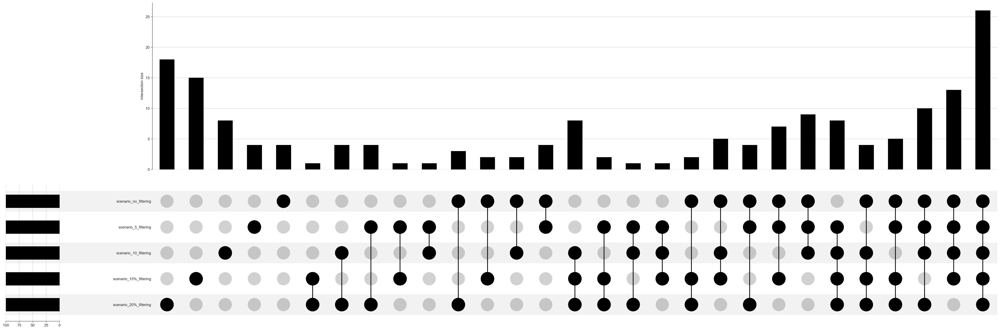

In [ ]:
#upsetplot to show the overlapping and non overlapping of genes or features between each scenario
#set size is = 100
import upsetplot
from upsetplot import generate_counts
from upsetplot import UpSet
from upsetplot import plot
from upsetplot import from_contents

data = from_contents({
    'scenario_no_filtering': scenario_files['scenario_no_filtering'].index,
	'scenario_5_filtering': scenario_files['scenario_5_filtering'].index,
	'scenario_10_filtering': scenario_files['scenario_10%_filtering'].index,
	'scenario_15%_filtering': scenario_files['scenario_15%_filtering'].index,
	'scenario_20%_filtering': scenario_files['scenario_20%_filtering'].index,
	
	#'scenarioP': scenario_files['scenarioP'].index
})
data


upset = UpSet(data, orientation='horizontal', element_size=100)
upset.plot()
plt.show()
#delete intersection dots 

In [21]:
#common features between all scenarios
common_features = set(scenario_files['scenario_no_filtering'].index).intersection(set(scenario_files['scenario_5_filtering'].index), set(scenario_files['scenario_10%_filtering'].index), set(scenario_files['scenario_15%_filtering'].index), set(scenario_files['scenario_20%_filtering'].index))
print(f'Common features between all scenarios: {len(common_features)}')
print(f'Common features between all scenarios: {common_features}')


Common features between all scenarios: 26
Common features between all scenarios: {'Ctsd', 'Rps25__ENSMUSG00000009927.9', 'Cd81__ENSMUSG00000037706.17', 'TAG(58:9)_TAG', 'Rpl41', 'Wfdc17', 'Slc25a5', 'Tm4sf4', 'Rps23-ps1', 'Sat1', 'Fcna', 'Folr2__ENSMUSG00000032725.10', 'Csf1r__ENSMUSG00000024621.15', 'Malat1__ENSMUSG00000092341.2', 'TAG(58:10)_TAG', 'Cd68', 'Rps27a', 'Trf__ENSMUSG00000032554.15', 'Rpl13', 'H2afz', 'Clec4f', 'Gm10275', 'Ighm', 'Lyz2', 'H2-D1', 'Id3__ENSMUSG00000007872.3'}


In [25]:
#list of features between all scenarios
common_features_list = list(common_features)
print(f'Common features between all scenarios: {common_features_list}')
common_features_list
#len(common_features_list)


Common features between all scenarios: ['Ctsd', 'Rps25__ENSMUSG00000009927.9', 'Cd81__ENSMUSG00000037706.17', 'TAG(58:9)_TAG', 'Rpl41', 'Wfdc17', 'Slc25a5', 'Tm4sf4', 'Rps23-ps1', 'Sat1', 'Fcna', 'Folr2__ENSMUSG00000032725.10', 'Csf1r__ENSMUSG00000024621.15', 'Malat1__ENSMUSG00000092341.2', 'TAG(58:10)_TAG', 'Cd68', 'Rps27a', 'Trf__ENSMUSG00000032554.15', 'Rpl13', 'H2afz', 'Clec4f', 'Gm10275', 'Ighm', 'Lyz2', 'H2-D1', 'Id3__ENSMUSG00000007872.3']


['Ctsd',
 'Rps25__ENSMUSG00000009927.9',
 'Cd81__ENSMUSG00000037706.17',
 'TAG(58:9)_TAG',
 'Rpl41',
 'Wfdc17',
 'Slc25a5',
 'Tm4sf4',
 'Rps23-ps1',
 'Sat1',
 'Fcna',
 'Folr2__ENSMUSG00000032725.10',
 'Csf1r__ENSMUSG00000024621.15',
 'Malat1__ENSMUSG00000092341.2',
 'TAG(58:10)_TAG',
 'Cd68',
 'Rps27a',
 'Trf__ENSMUSG00000032554.15',
 'Rpl13',
 'H2afz',
 'Clec4f',
 'Gm10275',
 'Ighm',
 'Lyz2',
 'H2-D1',
 'Id3__ENSMUSG00000007872.3']

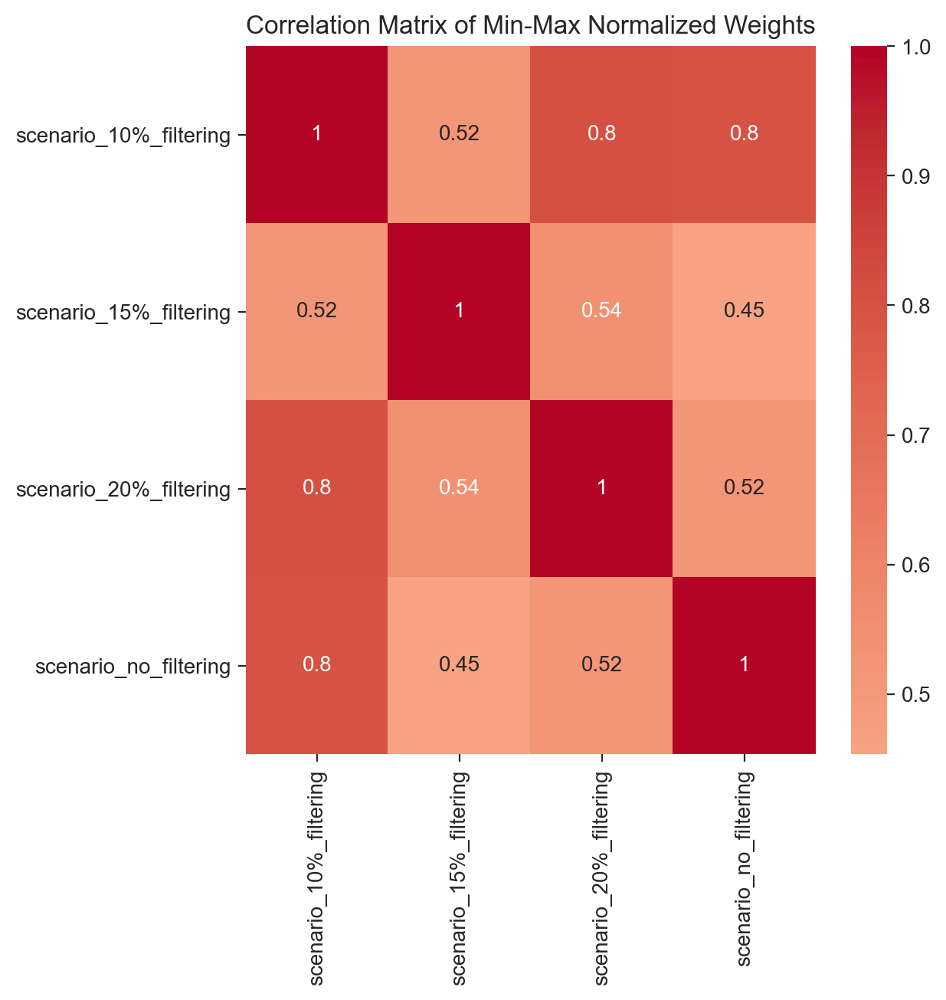

In [15]:
# Ensure 'min_max' column exists in all dataframes
for scenario, df in scenario_files.items():
	if 'min_max' not in df.columns:
		df['min_max'] = (df['sum_abs'] - df['sum_abs'].min()) / (df['sum_abs'].max() - df['sum_abs'].min())

# calculate the correlation matrix of min-max normalized weights
min_max_weights = pd.concat([scenario_files['scenario_10%_filtering']['min_max'], 
							 scenario_files['scenario_15%_filtering']['min_max'], 
							 scenario_files['scenario_20%_filtering']['min_max'], 
							 scenario_files['scenario_no_filtering']['min_max']], axis=1)

min_max_weights.columns = ['scenario_10%_filtering', 'scenario_15%_filtering', 'scenario_20%_filtering', 'scenario_no_filtering']
correlation_matrix = min_max_weights.corr()

# plot the correlation matrix
plt.figure(figsize=(6, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Matrix of Min-Max Normalized Weights")
plt.show()

In [16]:
#plot based on min_max normalized weights
plt.figure(figsize=(30, 30), dpi=500, clear=True, frameon= True)
for i, (scenario, df) in enumerate(scenario_files.items()):
    plt.subplot(3, 2, i+1)
    sns.barplot(x=df['min_max'][:50], y=df.index[:50])
    plt.title(f'{scenario}: Top 100 features')
    plt.xlabel('Min-Max Normalized Weights')
    plt.ylabel('Feature')
plt.tight_layout()

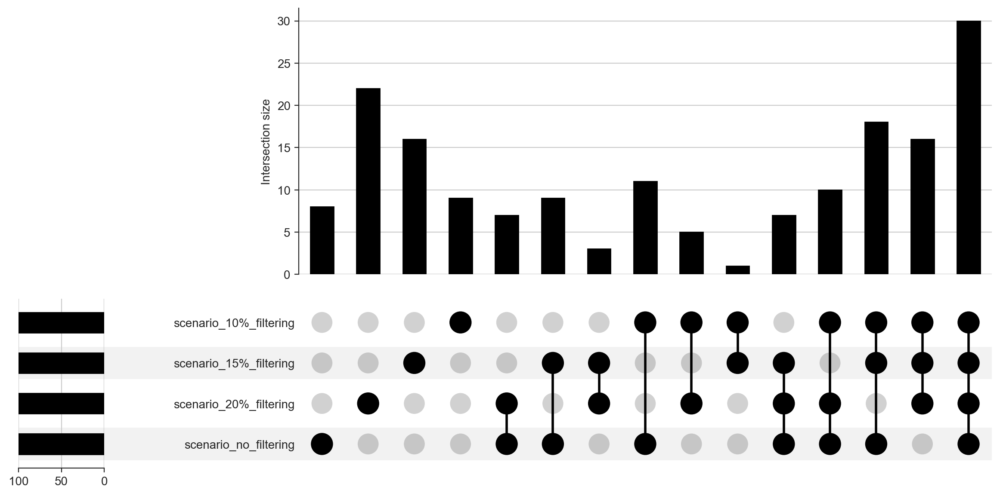

In [17]:
#upsetplot after min_max normalization
data = from_contents({
    'scenario_10%_filtering': scenario_files['scenario_10%_filtering'].index,
    'scenario_15%_filtering': scenario_files['scenario_15%_filtering'].index,
    'scenario_20%_filtering': scenario_files['scenario_20%_filtering'].index,
    'scenario_no_filtering': scenario_files['scenario_no_filtering'].index,
    #'scenarioP': scenario_files['scenarioP'].index
})
data

upset = UpSet(data, orientation='horizontal', element_size=50)
upset.plot()
plt.show()


In [18]:
#commen genes between all scenarios (L, M, N, O):
genes_L_M_N_O = set(scenario_files['scenario_10%_filtering'].index) & set(scenario_files['scenario_15%_filtering'].index) & set(scenario_files['scenario_20%_filtering'].index) & set(scenario_files['scenario_no_filtering'].index)
genes_L_M_N_O

#table of common genes between all scenarios with their min_max normalized weights
common_genes = pd.DataFrame(index=genes_L_M_N_O)
for scenario, df in scenario_files.items():
    common_genes[scenario] = df.reindex(genes_L_M_N_O)['min_max'].values
common_genes

print(common_genes)
common_genes.shape



                                 scenario_no_filtering  scenario_5_filtering  \
TAG(58:5)_TAG                                 0.021364                   NaN   
Ctsd                                          0.129664              0.281799   
Rps25__ENSMUSG00000009927.9                   0.121604              0.219445   
Cd81__ENSMUSG00000037706.17                   0.381754              0.420977   
Prdx2                                         0.047963                   NaN   
TAG(58:9)_TAG                                 0.195472              0.134752   
Rpl41                                         0.088412              0.128838   
Wfdc17                                        1.000000              1.000000   
Slc25a5                                       0.246670              0.231624   
Tm4sf4                                        0.696765              0.526066   
Rps23-ps1                                     0.012567              0.037737   
Sat1                                    

(30, 5)

-----------------------------------------------------------------------------------------------------------------------------------------------------

In [19]:
scenario_files = {
    #'scenarioA': mfx.mofa_model("scenario_A_mofa_model.hdf5"),
    'scenarioL': mfx.mofa_model("scenario_L_mofa_model.hdf5"),
    'scenarioM': mfx.mofa_model("scenario_M_mofa_model.hdf5"),
    'scenarioN': mfx.mofa_model("scenario_N_mofa_model.hdf5"),
    'scenarioO': mfx.mofa_model("scenario_O_mofa_model.hdf5"),
    'scenarioP': mfx.mofa_model("scenario_P_mofa_model.hdf5"),
}

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = 'scenario_L_mofa_model.hdf5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

In [ ]:
#calcute absolute sum for each scenario
for scenario, m in scenario_files.items():
    sum_abs= []
    weights_df = m.get_weights(df=True)
    for i in range(len(weights_df)):
        sum_abs.append(np.sum(np.abs(weights_df.iloc[i])))
    df = pd.DataFrame(weights_df)
    df['sum_abs'] = sum_abs
    df = df.sort_values(by='sum_abs', ascending= False)
    scenario_files[scenario] = df.iloc[:100]

scenario_files

{'scenarioL':                                  Factor1   Factor2   Factor3   Factor4  \
 Vsig4__ENSMUSG00000044206.3     0.682467 -1.660433  1.678061  0.959164   
 Adap2__ENSMUSG00000020709.15    0.913976  4.259333 -0.057563  1.627139   
 Cd164__ENSMUSG00000019818.15    0.430089 -3.431994 -0.638089  2.302976   
 Adap2os__ENSMUSG00000086507.1   0.910585  3.800419 -0.007956  1.681975   
 Hpgd__ENSMUSG00000031613.9      0.494243 -2.931020 -0.005488  1.353518   
 ...                                  ...       ...       ...       ...   
 Zfp263__ENSMUSG00000022529.11   0.836353  2.138486 -0.197183  1.972972   
 Kmt2d__ENSMUSG00000048154.16    0.263077  1.593072 -0.043535  1.493729   
 Trafd1__ENSMUSG00000042726.14   0.789740 -1.136522 -0.245147  0.408378   
 Sh3bgrl3__ENSMUSG00000028843.8  0.957157  0.029982  0.150518 -1.267825   
 Mau2__ENSMUSG00000031858.16     0.304678  1.831847  0.012868  0.273190   
 
                                  Factor5   Factor6   Factor7   Factor8  \
 Vsig4__EN

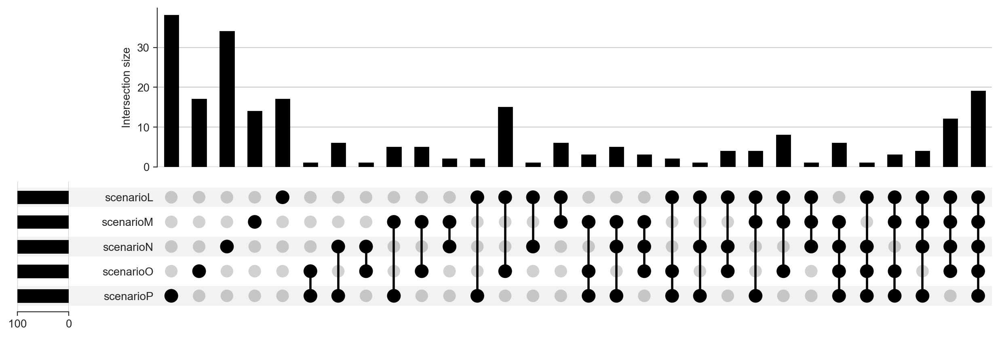

In [ ]:
#upset plot for top 1000 features for each scenario based on sum_abs values
from upsetplot import generate_counts
from upsetplot import plot
from upsetplot import from_contents
from upsetplot import UpSet

data = from_contents({
    'scenarioL': scenario_files['scenarioL'].index,
    'scenarioM':    scenario_files['scenarioM'].index,
    'scenarioN': scenario_files['scenarioN'].index,
    'scenarioO':    scenario_files['scenarioO'].index,
    'scenarioP': scenario_files['scenarioP'].index
})

upset = UpSet(data)
upset.plot()
plt.show()

In [ ]:
#list of common features in all scenarios
common_features = []
for feature in scenario_files['scenarioL'].index:
    if feature in scenario_files['scenarioM'].index:
        if feature in scenario_files['scenarioN'].index:
            #if feature in scenario_files['scenarioH'].index:
                if feature in scenario_files['scenarioO'].index:
                    #if feature in scenario_files['scenarioP'].index:
                        common_features.append(feature)
len(common_features)



31

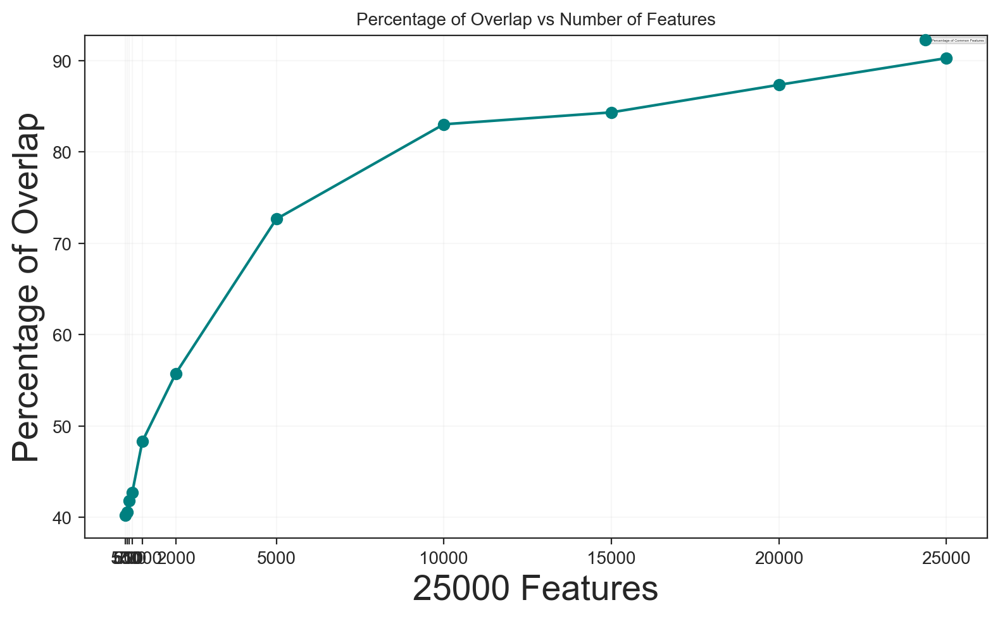

In [ ]:
import matplotlib.pyplot as plt

# Number of features selected
features_num = [ 500,550,600,700,1000,2000,5000,10000,15000,20000,25000]

# Calculate overlap percentages
overlap_percentages = []
for i in features_num:
	if i == 0:
		overlap_percentages.append(0)
		continue
	common_features = []
	for feature in scenario_files['scenarioL'].index[:i]:
		if feature in scenario_files['scenarioM'].index[:i]:
			if feature in scenario_files['scenarioN'].index[:i]:
				if feature in scenario_files['scenarioO'].index[:i]:
					common_features.append(feature)
	overlap_percentages.append(len(common_features) / i * 100)

# Plot the percentage of common features between scenarios
plt.figure(figsize=(8, 5))
plt.plot(features_num, overlap_percentages, marker='o', linestyle='-', color='teal', label='Percentage of Common Features')

# Plot settings
plt.title('Percentage of Overlap vs Number of Features', fontsize=10)
plt.xlabel('25000 Features', fontsize=20)
plt.ylabel('Percentage of Overlap', fontsize=20)
plt.grid(alpha=0.15)
plt.xticks(features_num)  # Set x-axis points
plt.legend(fontsize=2)
plt.tight_layout()

# Show plot
plt.show()



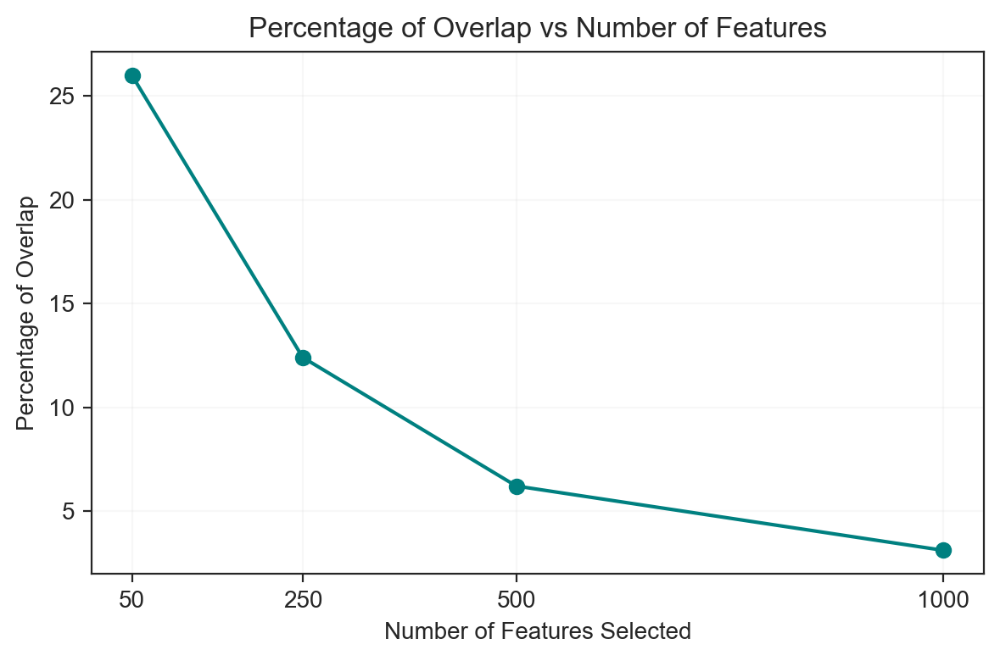

In [ ]:
overlap_percentages= []
features_num = [50,250,500,1000]	
for i in features_num:
    if i == 0:
        overlap_percentages.append(0)
        continue
    common_features = []
    for feature in scenario_files['scenarioL'].index[:i]:
        if feature in scenario_files['scenarioM'].index[:i]:
            if feature in scenario_files['scenarioN'].index[:i]:
                if feature in scenario_files['scenarioO'].index[:i]:
                    #if feature in scenario_files['scenarioP'].index[:i]:
                        common_features.append(feature)
    overlap_percentages.append(len(common_features) / i * 100)

overlap_percentages

#plot the percentage of common features between scenarios
plt.figure(figsize=(6, 4))
plt.plot(features_num, overlap_percentages, marker='o', linestyle='-', color='teal')
plt.title("Percentage of Overlap vs Number of Features")
plt.xlabel("Number of Features Selected")
plt.ylabel("Percentage of Overlap")
plt.grid(alpha=0.15)
plt.xticks(features_num)
plt.tight_layout()
plt.show()
